# Basics of Monte Carlo Simulations
Authors: Ralph Enderle, Marco Müller

# Table of Contents
* [Monte Carlo Simulation - What it is all about](#first-bullet)
* [How Monte Carlo Simulations work](#first-bullet)
* [The Law of Large Numbers](#first-bullet)
* [Central Limit Theorem](#first-bullet)
* [Monte Carlo Applied](#first-bullet)
* [Markov Chains](#first-bullet)

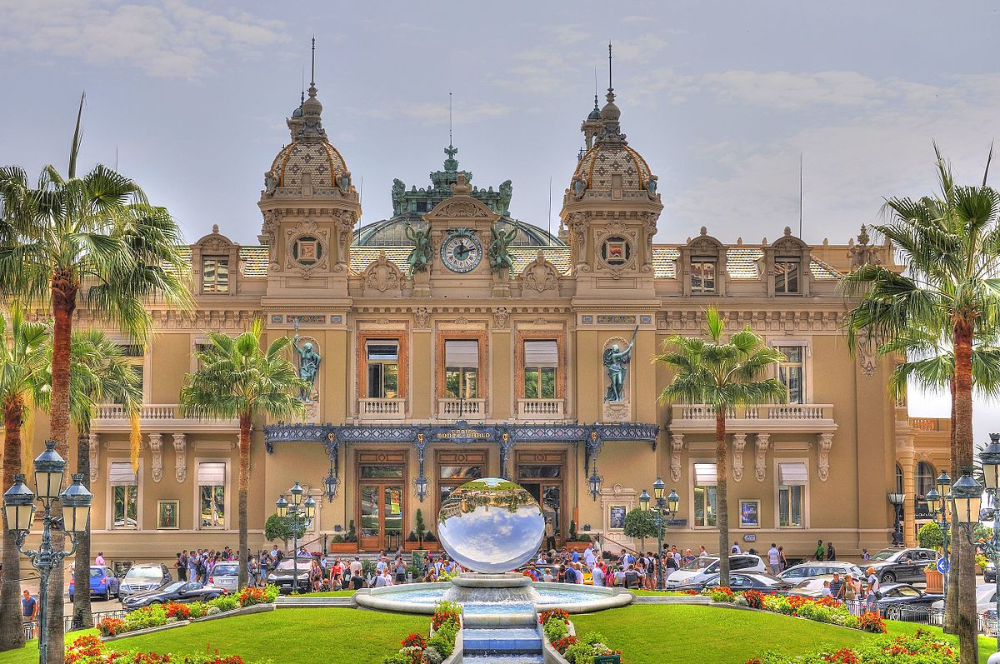

Casino Panoramio, a famous casino in Monte Carlo, Monaco; the city where the Monte Carlo simulation has its name from.
Source: [Wikipedia](https://en.wikipedia.org/wiki/Monte_Carlo_Casino#/media/File:Casinò_-_panoramio.jpg)

# Monte Carlo Simulation - What it is all about 

Generally speaking, Monte Carlo simulations are all computational procedures, that rely on performing a random experiment over and over again and thereby extract important statistical information. Hence, it is a computer-aided numerical technique, that is based on random sampling, with the help of which we can calculate important mathematical properties, for which an analytical solution does not exist. In order to do so, we would need to express the property we are interested in as a parameter of a hypothetical population and then use random numbers in order to simulate different samples of the population, with the help of which we can obtain statistical estimates for our parameter of interest. As such, we would simulate a random experiment in a computer over and over again and thereby learn something about the statistical properties we were originally interested in. The technique is mostly used when an analytical solution to a problem does not exist or is extremely complicated to calculate. Consider for example the distribution function of a standard normally distributed random variable $X$: $P(X \leq x) = \Phi(x) = \frac{1}{\sqrt{2\pi}} \int_{-\infty}^x e^{\frac{1}{2}x^2}$. As you might know from a statistics course, there does not exist an analytical solution for this integral, which is why we need to compute it numerically. While there are many different techniques to numerically integrate such a function, the Monte Carlo integration method offers one alternative. Generally, Monte Carlo simulations are wildly used by both academics and professionals in many fields, such as physics, chemistry, economics, finance and many more. Its applications range from simulations of atoms collisions to simulations of traffic flows and even to perform predictive analysis of stock indices. In the social sciences, the Monte Carlo simulation is a valuable tool to examine what results a particular course of action can bring, how probable those are and to quantitatively assess different risks.

The technique is named after the city of Monte Carlo in Monaco, which is famous for its casinos, where a lot of random experiments are carried out naturally (for an example of such a casino, see also the above picture). Moreover, as the technique involves the simulation of random experiments, it is called "Monte Carlo Simulation". It was originally developed in 1944 during the Manhatten Project in the second World War at the Los Alamos National Laboratory in order to calculate neutron diffusions for the development of the atomic bomb. However, since its introduction during the Second World War, Monte Carlo simulation has been used over time to model many different physical and conceptual systems.

# How Monte Carlo Simulations work

Generally, a Monte Carlo Simulation requires the following steps ([Missouri University of Science and Technology, p. 2–5](http://web.mst.edu/~dux/repository/me360/ch8.pdf)):

1. Specify an underlying data generating process as the population distribution and draw a random sample of size $n$ from it. While we could perfrom an actual random experiment like throwing a coin or a dice, report their outputs and use them for our purpose here, modern computer generate random numbers by themselves by means of arithmetic random-generators. Due to their algorithmic nature, these are called pseudo random numbers. These random variables will then be used as the input for the simulation. 

2. Using the simulated random variables, we then estimate the property of interest and draw again several samples, where we reestimate our quantity for every random draw. Hence, the results are recalculated again and again, each time using a different set of random values based on the assumed probability function. These individual sets of samples are called iterations and in the end, we have a total of $m*n$ random variables, $m$ samples and therefore also $m$ estimates. Thereby, the Monte Carlo simulation generates an empirical distribution of our estimator and hence does not only result in the possible results, but also assigns these individual results a probability of occurence via the empirical distribution.

3. Finally, we can proceed to perfom statistical analysis in order to assess the statistical properties of our estimator. Since we know the data generating process, we could let go $n$ to infinity and check whether we have a consistent estimate for the property of interest, see to which value the estimator converges and inspect how the standard deviation of the estimator behaves.     

These steps are again nicely summarized in the following flow chart: 

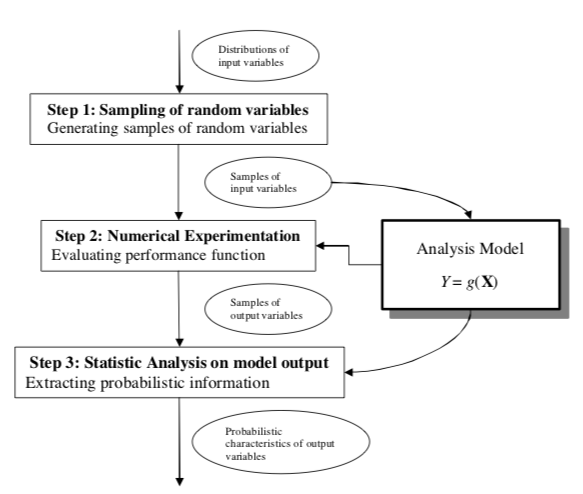
Source: [Missouri University of Science and Technology, p. 2](http://web.mst.edu/~dux/repository/me360/ch8.pdf)


# Law of Large numbers (LLN) 

If we are given a sequence $X_n$ of random variables, then almost always the sequence does not converge. However, we can get some information on how the mean of the sequence behaves. Intuitively speaking, when we consider the mean, instead of the whole sequence itself, we could expect some kind of stabilizing behaviour, as the influence of single random variables $X_i$ get less and less weight, if we increase the number $n.$ 
This intuition is exactly, what the Law of Large numbers formalizes in the following theorem: 

Let $X_1,..., X_n$ be a sequence of independent random variables, each with an expected value of $E[X_i] = a < \infty$ and $Var(X_i) = b^2 < \infty$. Then, the LLN states that $\forall \epsilon > 0$

\begin{equation}
\lim_{n \to \infty} P(| \bar{X_n} - a | > \epsilon) = 0 ,
\end{equation}

where $\bar{X_n} = \frac{1}{n} \sum_{i=1}^n X_i$ denotes the sample mean. More compactly, we could also write $\frac{1}{n} \sum_{i=1}^n X_i \overset{p}{\to} a$ for $n \to \infty$. Note, that we did not assume, that the $X_i$ are identically distributed, we only assumed, that they have the same finite expected value and the same finite variance. The implications of the LLN are therefore strong and very useful, because it says, that when we are sampling randomly from a population, we don't need to specify the distribution of the random variables, but instead only need to argue that our sample draws have the same mean and variance. Then, by taking enough samples, we can get arbitrarily close to the first population moment $E[X_i]$, without speficying it in the first place. Why is this useful, you wonder? Well, mathematically, the expected value of a random variable $X$ is defined as $E[X] = \int_{-\infty}^\infty x dF(X)$, where $F(X) = P(X \leq x)$ denotes the cumulative distribution function of X. Hence, when we are computing expected values, we have to solve this (Riemann-Stieltjes) integral, which might be very complicated or even impossible to do analytically. In case the distribution function $F(x)$ is differentiable we can simplify the integral to a Riemann integral, such that the expected value is then given by: $E[X] = \int_{-\infty}^\infty x f(X)dx$, where $f(x) = \frac{\partial F(x)}{\partial x}$ represents the probability density function of $X$. Nevertheless, it still might be very complicated to calculate the latter integral analytically and in lots of real world applications, the assumption of differentiability is not even plausible.

Therefore, instead of trying to find a solution to the above integral, we can use the Law of Large numbers (if the conditions are satisfied) to get arbitrarily close to the expected value. The LLN is therefore really *the* basis of Monte Carlo methods, as it guarantees the sample representation of the first population moment is indeed a consistent estimator for the latter. If a random experiment (or a simulation) is always carried out under the same conditions, the relative frequency approaches more and more the probability of the random experiment. We now illustrate the law of large numbers with the following intuitive example:  

Suppose I would suggest you the following game: I would throw a **biased** (i.e. unfair) and you could bet on either outcome. If you get it right, you win 1CHF and else you lose 1 CHF. However, I wouldn't tell you something about the probability distribution of getting heads or tails. Nevertheless, you are still eager to bet on either outcome, but first, you are allowed to inspect the coin. Now, you know, that the probability of getting heads (or tails, respectively) follows a Bernoulli distribution with an unknown parameter $p$, representing the unknown success probability of getting heads. Therefore, we let $X_i$ be our random variable and define it as follows
\begin{equation} 
   X_i = \begin{cases} 
     1, & \text{if coin shows heads }  \\ 
     0, & \text{if coin shows tails } 
   \end{cases} 
\end{equation} 



In [1]:
using Distributions, Plots, Random 

# setting the seed 
Random.seed!(1234)

p = .3  # probability of getting heads (which I wouldn't tell you)
flips = 300 # number of coin flips

# Simulate coin flips following a Bernoulli distribution with parameter p
coin_flips = rand(Bernoulli(p), flips);

In our case, it is very easy to calculate the expected value, which is simply $E[X] = 1 p + 0 (1-p) = p$. But again, in real world applications, it might be much more complicated to derive the expected value analytically. However, now that we know what the $E[X_i]$ represent here, namly the success probability $p$, we can use the law of large numbers to find out, how much $p$ really is. But first, we ask ourselves, whether the assumptions of the LLN in our example are satisfied? Well, the tosses are surley independent of each other and, in fact, they are even indentical with both a finite mean of $p$ and a variance of $p(1-p)$. Therefore, we can apply the LLN. You now proceed to throw the coin several times and calculate the average number of heads, since you know that $\bar{X_n} \overset{p}{\to} E[X_i] = p$. 

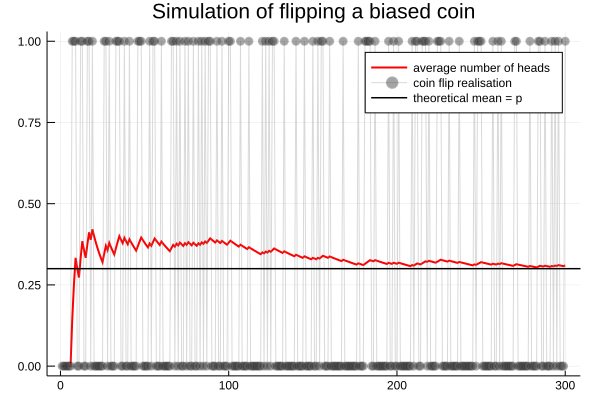

In [2]:
number_heads = cumsum(coin_flips)
average_heads = number_heads ./ (1:flips)


# make plot
plot(1:flips, average_heads, title = "Simulation of flipping a biased coin", label = "average number of heads", lw = 2, colour = "red")
plot!(1:flips, coin_flips, label = "coin flip realisation", colour = "grey", markershape = :circle, alpha = 0.3)
hline!([p], color = :black, label = "theoretical mean = p", lw = 1.5 )

Hence, after performing the experiment several times, the LLN assures you, that the average number of heads you get out of the experiment is converging in probability to the real (and to you unknown) success probability parameter $p$. Now, that you know $p$, it is time for you to earn some money: you would always bet on heads, if $p > 0,5$ and on tails if $p<0.5$ and thereby earn more and more money, the more you play the game. Only if $p=0.5$, the game would be fair and in this case, you would on average neither earn, nor lose any money. 

### Explain it to Grandma 


Dear Grandma, suppose I perform a random experiment, like flipping a coin. Since we don't know, whether it will show heads or tails with certainty, this experiment involves randomness and is therefore indeed a random experiment. Intuitively, you could probably tell from experience, that there is a 50% chance of getting heads and a 50% chance of getting tails. Therefore, if we perform the exact same experiment several times, i.e. we flip the coin, say, 100 times, we should get around 50% of the flips heads and 50% tails. However, we might end up with maybe 48 heads and 52 times tails. Hence, we are *almost* getting half of the times heads and tails, but no exactly yet. The Law of Large number now assures us, that if we would perform this experiment even more, say 1000 or 1'000'000 times, then we would get closer and closer to having exactly 50% heads showing up and 50% tails. 



# Central Limit Theorem (CLT) 

In economics and in the social sciences in general the normal distribution is one of the most widly used distributions. The reason for the omnipresence of the normal distribution lies in the central limit theorem. In order to formally define it, we let $X_1,...,X_n$ be a sequence of jointly distributed random variables, each with a finite mean $E[X_i] = \mu_i$ and a finite standard deviation $\sigma(X_i) = \sigma_i$. Then, for the sum $S_n = X_1 + ... + X_n$, it holds:

\begin{equation}
\frac{S_n - E[S_n]}{\sigma(S_n)} \overset{d}{\to} N(0,1)
\end{equation}

In case $X_1,...,X_n$ are also identically distributed with $E[X_i] = \mu$ and $\sigma(X_i)= \sigma, \forall i$. Then the Central Limit Theorem states:

\begin{equation}
\frac{S_n - n \mu}{\sqrt{n} \sigma} \overset{d}{\to} N(0,1),
\end{equation}

which is equivalet to the following statement, in case we want to consider the asymptotic behaviour of the mean $\bar{X_n}$, instead of the sum:

\begin{equation}
\frac{\sqrt{n}(\bar{X_n} - \mu)}{\sigma} \overset{d}{\to} N(0,1) \Leftrightarrow \sqrt{n}(\bar{X_n} - \mu)\overset{d}{\to} N(0,\sigma^2),
\end{equation}

Therefore, the CLT states, that if we don't look at single random variables, but instead look at the sum or the average of those and properly normalize these quantities, then this sum or average follows a standard normal distribution. The version of the CLT involving the mean ($\sqrt{n}(\bar{X_n} - \mu)\overset{d}{\to} N(0,\sigma^2)$) says, that if we draw several random samples, calculate the average each time and look at how far away this average value is from the true mean, then this distance between the true and the estimated mean follows a normal distribution with a variance of $\sigma^2$ (only if it had been multiplied by $\sqrt{n}$).

Why should this be useful you ask? Well, assume that we don't know the distribution of the population, from which we are sampling randomly. If we can justify the assumption, that our random draws are iid distributed with a finite mean and a finite variance, then we know that the properly normalized sum or the average is approaching a standard normal distribution, as we let the sample size $n$ go to infinity. Therefore, if we are interested in analysing a mean or a sum of random variables, we don't need to know the underlying distribution, since the CLT assures us, that we have a convergence in the distribution for these quantities. Since sums and averages are considered often in statistics (e.g. in the context of point estimation problems), the normal distribution emerges very often as an appropriate limit law and the assumption of a normal distribution is therefore mostly justified. In the context of parameter estimation, the class of the consistent and asymptotically normal estimators (the CAN class) is quite dense, due the the CLT and this allows us to compare different estimators in terms of efficiency with each other and to carry out hypothesis tests and build confidence intervals. Again, if the CLT is applicable, we can also do this, if our population is not normally distributed and in fact, we don't even need to know the distribution of the population. This is the reason, why the CLT is so powerful. From a practical point of view, most statistics text books recommend a sample size of at least $n=30$, in order to apply the CLT.

Finally, we shall now visualize the CLT using Julia:

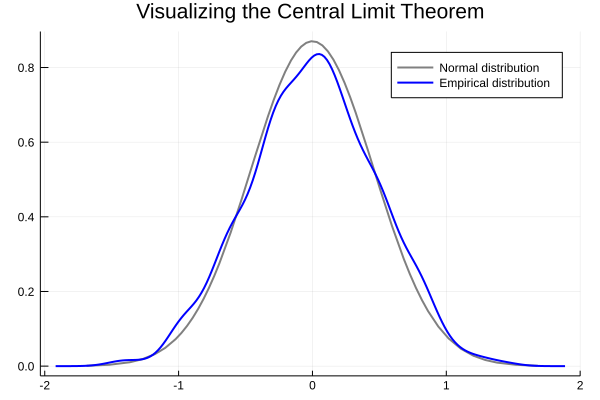

In [3]:
using StatsPlots

# setting the seed 
Random.seed!(1)

# Initialize sample size and distribution
dist = Bernoulli(p)    # in this example, we let the X_i follow a Bernoulli distribution with parameter p
sample_size = 1000      # specify the sample size of one sample
sample_number = 1000  # specify how many samples we should draw

# Specify distrbution parameters
p = 0.3             # success probability
μ = p               # the mean of X_i
σ = sqrt(p*(1-p))   # the standard deviation of X_i

# Create random sample
my_sample = rand(dist, sample_size, sample_number)

# Calculate the mean of each sample and create empirical distribution
sample_means = mean(my_sample, dims = 1) 
my_dist = (sqrt(sample_size)) * (sample_means .- μ)

# Plot empirical distribution against a N(0,σ)
plot(Normal(0, σ), color = "grey", label = "Normal distribution", lw = 2, title = "Visualizing the Central Limit Theorem")
density!(transpose(my_dist), color = "blue", label = "Empirical distribution", lw = 2)


Hence, as can be seen above, if we sample from a Bernoulli distribution and calculate the expression $\sqrt{n}(\bar{X_n} - \mu)$ from the CLT, then we can see, that this expression approaches a normal distriution $N(0, \sigma^2)$, as we increase the sample size. 


### Explain it to Grandma 

Dear Grandma, let me tell you something about statistics. In order to work with probabilities, we define so-called probability functions and distributions, with the help of which we can address the probability of certain events, as for example the probability of getting a six, if I would throw a fair dice. In fact, there are quite a lot of different probability distributions. So, therefore, let me tell you, that it should be of no surprise, that when I encounter a random setting, I might not really know with which distribution I should work. This is where the CLT comes into play: Instead of considering each outcome of the experiment by its own and wondering about its distribution, I would tell myself: "Hey, let's just consider the sum or the average of those outcomes", because I know, that I can do some easy adjustments of these quantities and then the CLT assures to me, that they follow a very important distribution, that is encountered a lot in statistics; the so-called normal distribution. So, it doesn't matter that I don't know the individual distribution, if I want to consider a sum or an average of them, because I know the distribution of the sum or the average, thanks to the CLT. Putting it a bit shorter, the CLT states that the distribution of the sample mean values (or, equivalently, the sum of the sample values) of several samples, approaches a normal distribution with increasing sample size, if the latter quantities have been transformed correctly.

# Monte Carlo Applied
To honour the name Monte Carlo and to show an applied example, we have decided to simulate the game of **roulette**. In doing so, we first have to simulate the game. For the function **playRoulette()** the French rules are used. For simplicity reasons, we define all numbers above 18 as red. Additionally, all players will always play the colour red. This approach is acceptable since switching colours will not change the likelihood of winning for the players. The house wins if the result is black or 0. 

In [4]:
#Function that simulates roullet according to the French rules.  

function playRoullete()
    #Simulation of a game of roulette. All numbers between 0 and 36 are drawn with equal probability.
    roll = rand(0:36)
   
    #If the player wins, the function returns true. If the player loses, false is returned.
    if roll == 0
        return false
    elseif roll > 18
        return true
    else 
        return false
    end
end

playRoullete (generic function with 1 method)

Roulette needs not only a table to play but also players. The below **betting()** function simulates a player. The variable **'funds'** defines how much money the player has. The **'bet'** variable defines how much the player bets per round played. The **'numberBets'** variable defines the number of games played.

In [5]:
#This function simulates a player. 

function betting(funds, bet, numberBets)
    
    #Stores the games number from first to last game played
    xValues = []
    #Stores the remaining funds after each game played
    yValues = []
    
    #used to keep track of the number of games played
    betCounter = 1
    
    while betCounter <= numberBets
        #increases the players funds if he wins
        if playRoullete()
            funds += bet
        #decreases the players funds if he looses
        else 
            funds -= bet   
        end
        
        #Takes the updated funds / iteration number and pushes them to the prepared empty lists
        push!(xValues, betCounter)
        push!(yValues, funds)
        
        betCounter += 1
    end
    
    #returns the time series of the development of the funds 
    return xValues,yValues
    
end

betting (generic function with 1 method)

The **createPlots()** function takes the parameters **'numberPlayers', 'funds', 'bet'** and **'numberBets'** to define the number of players in the simulation, the funds each player has, the amount each player bets per round and the number of sequential bets played. These parameters are then used to execute the betting function **simulate** the games and **plot** the results.  

In [38]:
#parameters of the simulation

numberPlayers = 100 #the number of simulated players
funds = 10000 #the simulated amount of cash each player holds
bet = 100 #the cost of a lost bet and the win of a won bet
numberBets = 100 # the number of bets placed per player

#This function takes the above defined parametersa and executes the betting function to simulate the games
#and then plot the results.

function createPlots(numberPlayers, funds, bet, numberBets)
    
    #Execute betting function and create the initial plot
    xValues, yValues  = betting(funds, bet, numberBets)
    plot(xValues, yValues, xlab = "numberBets", ylab = "funds", label = "", linecolor = "blue")
    
    #Execute betting function (numberPlayers-1) times and add the results to the created plot
    for i in 1:(numberPlayers-1)
        xValues, yValues  = betting(funds, bet, numberBets)
        plot!(xValues, yValues, label = "", linecolor = "blue")
    end
    
    plot!(1:length(xValues), (1:length(xValues))*.0, label = "", linecolor = "red")
    
    #display the created plot
    display(plot!())
end


createPlots (generic function with 1 method)

Now we are set up for the simulation. Initially, we simulate 100 players, playing 100 rounds of roulette each, betting 100 per round with the option to win 100. The below graph is insofar interesting as there is **no clear tendency** visible yet. There are quite a few people who **made money** even though we know that the game is **rigged** in favour of the bank. Maybe we haven't played enough rounds yet?

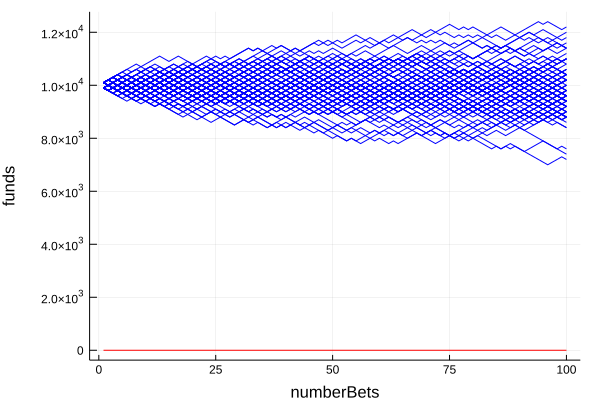

In [39]:
createPlots(numberPlayers, funds, bet, numberBets)

Now we simulate again 100 players, betting 100 per round with the option to win 100. However, each player will now do 1000 sequential bets. Looking at the below graph, after 1000 rounds there is a **downwards tendency** visible. Nonetheless, there are still players that have **increased** their initial funds.

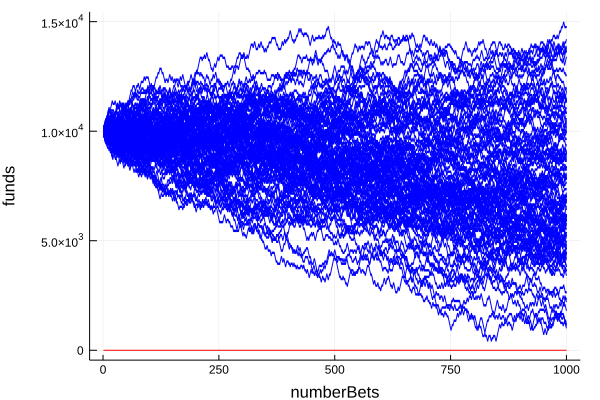

In [40]:
createPlots(numberPlayers, funds, bet, 1000)

To make the effect more visible we increase the number of rounds played to 10000 ceteris paribus. After 10000 rounds there is a **strong downwards tendency** visible. Most players can now be found below the red line at 0. These players have **lost** all their initial capital of 10000. The blue lines below the red line at 0 are the debts that they would have accumulated if they had kept playing.

In [41]:
createPlots(numberPlayers, funds, bet, 10000)

*What is the power of the Monte Carlo Simulation method shown with this example?* From the outside, in the short to mid term, it looks as if there are **hyper succesfull** roulette players that outperform everybody else. This makes other people belief that there might be a trick to it. Also, people use pseudo statistics like: "The ball stopped five times at black, the next one has to be red", even tough the chances remain the same. **Monte Carlo shows the truth hidden in large numbers of trials**. These hyper succesfull players are statistical coincidences. The truth is, nonregarding the variance an oddities, **the bank wins** always if you play long enough.

# Markov Chains

## Life of a Worker


In [2]:
P = [0.8 0.2; 0.35 0.65]
state_values = ["Employed", "Unemployed"]
initial_state = 1
T_simulation = 12

# Create an Array that contain the categorical distributions given by the Markov matrix
myP = [Categorical(P[1,:]), Categorical(P[2,:])]

# Initialise a vector of simulated states with the initial state
simulated = fill(initial_state, T_simulation)

for t = 2:T_simulation
    simulated[t] = rand(myP[simulated[t-1]])
end

simulated = state_values[simulated]

12-element Array{String,1}:
 "Employed"  
 "Employed"  
 "Employed"  
 "Employed"  
 "Employed"  
 "Employed"  
 "Employed"  
 "Unemployed"
 "Unemployed"
 "Unemployed"
 "Unemployed"
 "Unemployed"

## Conversion to Steady State

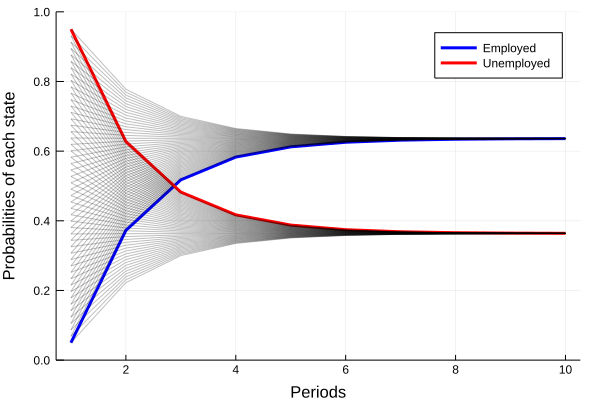

In [3]:
clibrary(:cmocean)

# Specify parameters
periods = 10
nInitialE = 50
lbInitialE = 0.05
ubInitialE = 0.95
InitialEs = range(lbInitialE, stop = ubInitialE, length = nInitialE)


# Iterate over initial states
for E in InitialEs
    ψ_0 = [E 1.0-E]
    ψs = Array{Float64}(undef,periods,2)
    ψs[1,:] = ψ_0

    for t = 2:periods
        ψs[t,:] = transpose(ψs[t-1,:])*P
    end
    
    if E == lbInitialE # First iteration
        myLabel = state_values
        myColor = [:blue :red]
        myLineWidth = 3
        myAlpha = 1
        plot()
    else
        myLabel = ""
        myColor = :gray
        myLineWidth = 1
        myAlpha = 0.25
    end
    
    # Create plot
    myplot = plot!(1:periods, ψs, label = myLabel, 
                    linecolor = myColor,
                    lw = myLineWidth,
                    alpha = myAlpha,
                    ylims = (0,1), xlabel = "Periods", ylabel = "Probabilities of each state")
    
    if E == ubInitialE # Last Iteration
        display(myplot)
    end
end